In [1]:
from PIL import Image
import numpy as np
import cv2
import math

In [2]:
from ultralytics import YOLO
# This needs to be the absolute path for some reason
model_path = "/Users/mohammadalikhan/Desktop/Projects/Rock_climbing_companion/best.pt"
model= YOLO(model_path)

In [50]:
img_path = "../test_images/4.jpg"
img = Image.open(img_path)

In [51]:
def predict_and_detect(chosen_model, img_path):
    results = chosen_model.predict(img_path, conf=0.25, imgsz=(640,640), iou=0.45, agnostic_nms=True)
    holds = []
    img = Image.open(img_path)
    img = np.array(img)

    # Extracting hold images
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = int(box.xyxy[0][0]), int(box.xyxy[0][1]), int(box.xyxy[0][2]),int(box.xyxy[0][3])
            holds.append(img[y1:y2,x1:x2].copy())
            
    # Drawing the bounding boxes
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = int(box.xyxy[0][0]), int(box.xyxy[0][1]), int(box.xyxy[0][2]),int(box.xyxy[0][3])
            cv2.rectangle(img, (int(box.xyxy[0][0]), int(box.xyxy[0][1])),
                          (int(box.xyxy[0][2]), int(box.xyxy[0][3])), (255, 0, 0), 2)
            cv2.putText(img, f"{result.names[int(box.cls[0])]}",
                        (int(box.xyxy[0][0]), int(box.xyxy[0][1]) - 10),
                        cv2.FONT_HERSHEY_PLAIN, 1, (255, 0, 0), 1)
            
    return img, holds

In [5]:
# Utility functions for drawing

def resize_hold(hold, H, W):
    h, w, _ = hold.shape
    w = int(w/h*H)
    h = H
    hold = cv2.resize(hold, (h, w))
    if w>W:
        h = int(h/w*W)
        w = W
        hold = cv2.resize(hold, (h, w))
    return hold
    

def make_grid(hold_list, n_cols=5):
    grid = []
    H, W = 50, 50
    index = len(hold_list)
    n_rows = int(math.ceil(index/n_cols))
    result = np.zeros(((n_rows)*H, (n_cols)*W, 3), dtype=np.uint8)
    i, j = 0, 0
    for hold in hold_list:
      img = np.zeros((H,W,3), dtype=np.uint8)
      hold = resize_hold(hold, H, W)
      h,w, _ = hold.shape
      l1, l2 = H//2-h//2, H//2+h//2
      if l2-l1!=h: l2+=1
      r1, r2 = W//2-w//2, W//2+w//2
      if r2-r1!=w: r2+=1
      img[l1:l2, r1:r2, :] = hold 
      result[i*H:i*H+H, j*W:j*W+W,:] = img
      j+=1
      if j==n_cols:
        i+=1
        j=0

    return result


image 1/1 /Users/mohammadalikhan/Desktop/Projects/Rock_climbing_companion/notebooks/../test_images/4.jpg: 640x480 33 Holds, 110.7ms
Speed: 44.5ms preprocess, 110.7ms inference, 14.6ms postprocess per image at shape (1, 3, 640, 480)


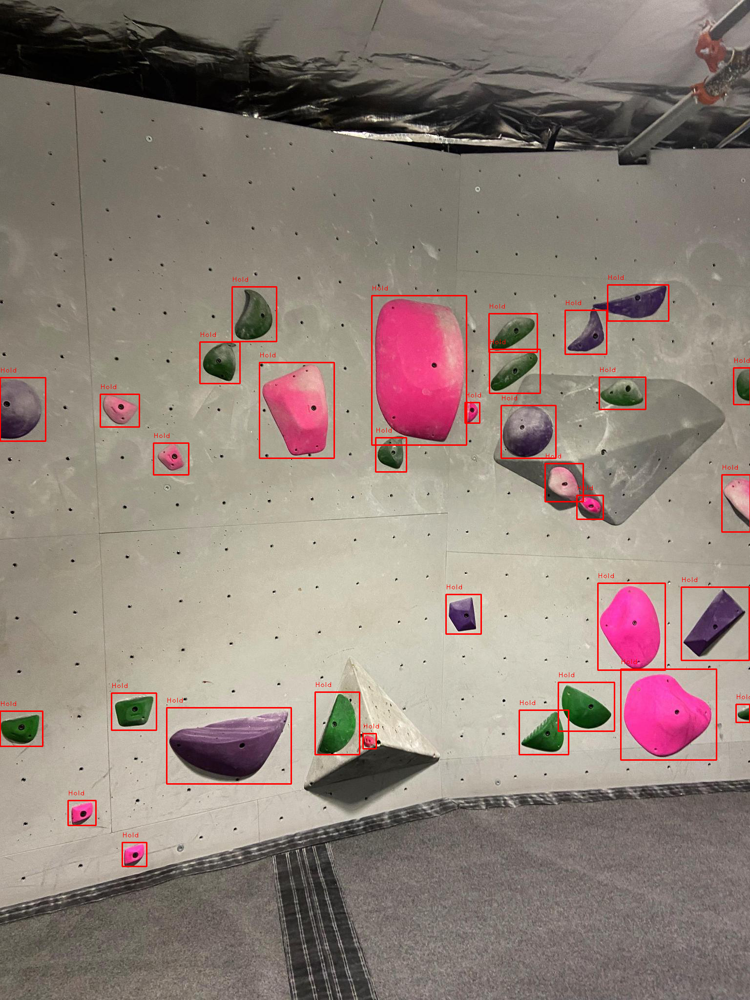

In [52]:
out, holds = predict_and_detect(model, img_path) #output image, list of hold images
display(Image.fromarray(out))

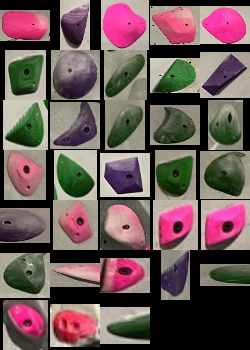

In [53]:
hold_grid =Image.fromarray(make_grid(holds)) # displaying hold images as a grid
display(hold_grid)

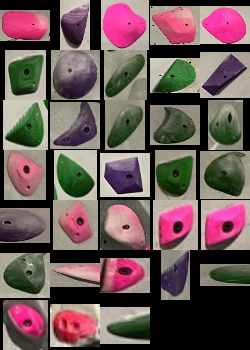

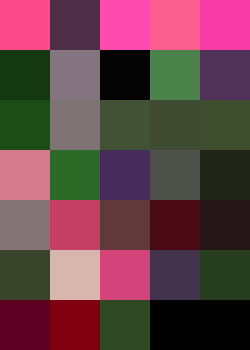

In [55]:
sim = np.zeros((len(holds), len(holds)))

def get_dominant_color(pil_img):
    img = pil_img.copy()
    # img = img.convert("RGBA")
    img = img.resize((1, 1), resample=0)
    dominant_color = list(img.getpixel((0, 0)))

    return dominant_color

dominant_colors = [get_dominant_color(Image.fromarray(hold)) for hold in holds]
dominant_color_images = []
for i in range(len(dominant_colors)):
    img = np.ones((50,50,3), dtype=np.uint8)
    img[:,:,0] = dominant_colors[i][0]
    img[:,:,1] = dominant_colors[i][1]
    img[:,:,2] = dominant_colors[i][2]
    dominant_color_images.append(img)

display(hold_grid)
display(Image.fromarray(make_grid(dominant_color_images)))



In [76]:

from skimage import color
def get_cosine_similarity(i1, i2):
    c1, c2 = dominant_colors[i1], dominant_colors[i2]
    sim = np.dot(c1,c2)/(np.linalg.norm(c1)*np.linalg.norm(c2))
    return sim

def get_euclidean_similarity(i1, i2):
    c1, c2 = np.array(dominant_colors[i1]), np.array(dominant_colors[i2])
    sim = np.linalg.norm(c1-c2)
    return sim


def get_lab_similarity(i1, i2):
    
    i1= i1/255
    i2 = i2/255
    lab1, lab2 = color.rgb2lab(i1), color.rgb2lab(i2)
    sim = np.linalg.norm(lab1-lab2)
    return sim
    
    

In [87]:
cos_sim = np.zeros((len(holds), len(holds)))
for i in range(len(holds)):
    for j in range(len(holds)):
        cos_sim[i,j] = get_cosine_similarity(i,j)

euc_sim = np.zeros((len(holds), len(holds)))
for i in range(len(holds)):
    for j in range(len(holds)):
        euc_sim[i,j] = get_euclidean_similarity(i,j)

lab_sim = np.zeros((len(holds), len(holds)))
for i in range(len(holds)):
    for j in range(len(holds)):
        lab_sim[i,j] = get_lab_similarity(holds[i], holds[j])

ValueError: operands could not be broadcast together with shapes (306,194,3) (156,255,3) 

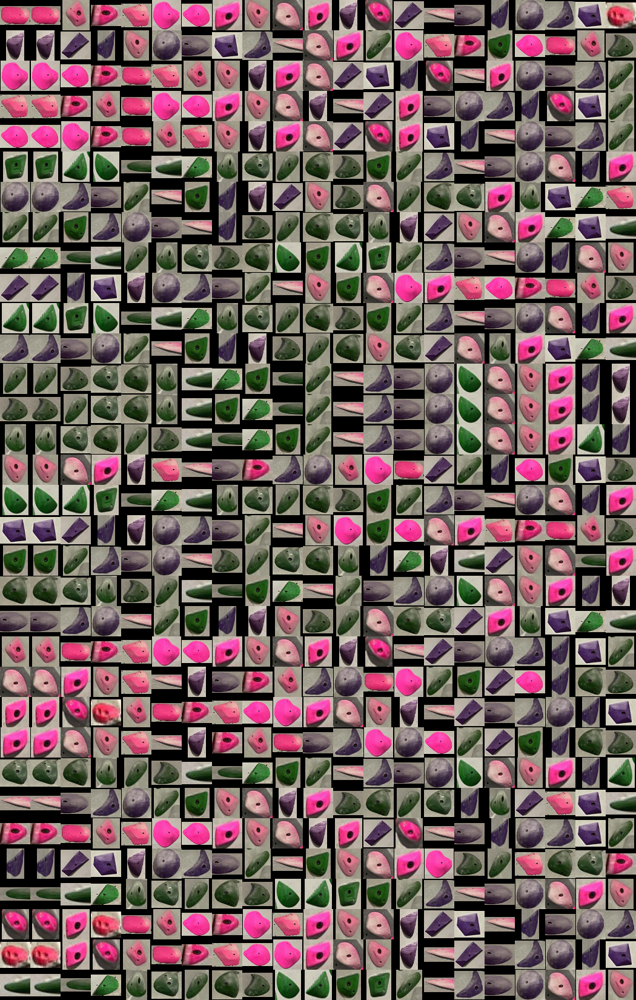

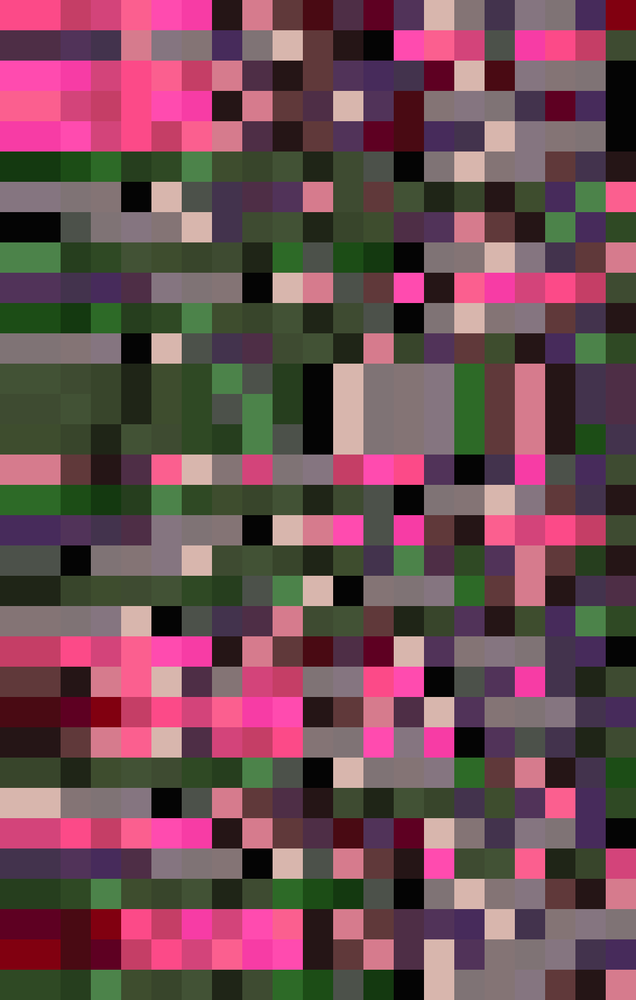

In [89]:
# Cosine similarity experiment
sim_sorted_indices = np.argsort(cos_sim, axis=1)
sim_sorted_indices = sim_sorted_indices[:,::-1] 

sim_sorted = np.sort(cos_sim, axis=1)
sim_sorted = sim_sorted[:,::-1]

L = 20

sim_sorted_images = []
sim_color_images = []
for index, hold in enumerate(holds):
    similar_holds = sim_sorted_indices[index][:L]
    similar_hold_images = [holds[i] for i in similar_holds]
    similar_hold_images.insert(0, holds[index])
    sim_sorted_images.extend(similar_hold_images)

    color_images = [dominant_color_images[i] for i in similar_holds]
    color_images.insert(0, dominant_color_images[index])
    sim_color_images.extend(color_images)

# print(len(sim_color_images))
display(Image.fromarray(make_grid(sim_sorted_images, n_cols=L+1)))

display(Image.fromarray(make_grid(sim_color_images, n_cols=L+1)))

# for i in range(len(holds)):
#     print(f" Index {i} Top {L} Similarities: {sim_sorted[i][:L]}")
    



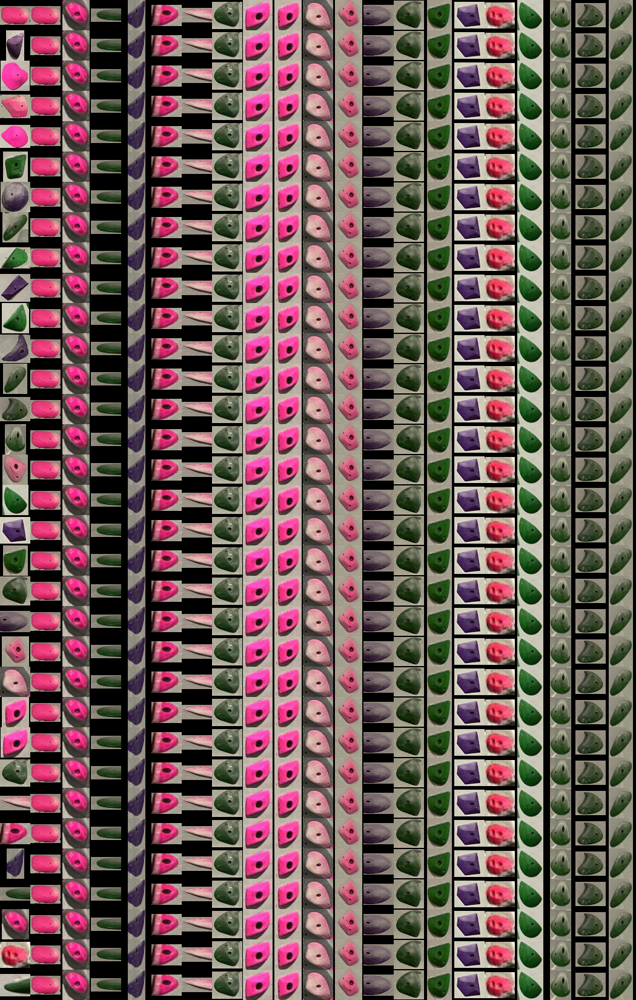

In [86]:
## LAB similarity experiment

sim_sorted_indices = np.argsort(lab_sim, axis=1)

sim_sorted = np.sort(cos_sim, axis=1)
sim_sorted = sim_sorted[:,::-1]

L = 20

sim_sorted_images = []
sim_color_images = []
for index, hold in enumerate(holds):
    similar_holds = sim_sorted_indices[index][:L]
    similar_hold_images = [holds[i] for i in similar_holds]
    similar_hold_images.insert(0, holds[index])
    sim_sorted_images.extend(similar_hold_images)

    color_images = [dominant_color_images[i] for i in similar_holds]
    color_images.insert(0, dominant_color_images[index])
    sim_color_images.extend(color_images)

# print(len(sim_color_images))
display(Image.fromarray(make_grid(sim_sorted_images, n_cols=L+1)))

# display(Image.fromarray(make_grid(sim_color_images, n_cols=L+1)))

# for i in range(len(holds)):
#     print(f" Index {i} Top {L} Similarities: {sim_sorted[i][:L]}")
    



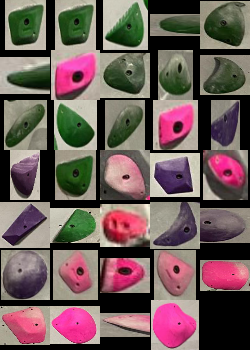

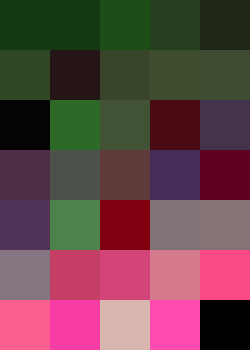

In [62]:
#Euclidean similarity

sim_sorted = np.argsort(euc_sim, axis=1)
# sim_sorted = sim_sorted[:,::-1] 

hold_index = 5
similar_holds = sim_sorted[hold_index]

similar_dominant_color_images = [dominant_color_images[i] for i in similar_holds]
similar_dominant_color_images.insert(0, dominant_color_images[hold_index])

similar_hold_images = [holds[i] for i in similar_holds]
similar_hold_images.insert(0, holds[hold_index])

display(Image.fromarray(make_grid(similar_hold_images)))
display(Image.fromarray(make_grid(similar_dominant_color_images)))

